# Classification Examples

- Decision tree is a type of supervised learning algorithm (having a pre-defined target variable) 
that is mostly used in classification problems. It works for both categorical and continuous input and output variables.


- Random forests or random decision forests are an ensemble learning method for classification, 
regression and other tasks, that operate by constructing a multitude of decision trees at 
training time and outputting the class that is the mode of the classes (classification) or 
mean prediction (regression) of the individual trees.


- Logistic Regression is a classification algorithm.  It is used to predict binary outcome (1/0, Yes/No, True/False) given a set of independent variables. To represent binary/categorical outcome, we use dummy variables.


###  1. DecisionTree for hiring a candidate

In this example, there is a dataset containing recruiter information for some employers. The aim is to find whether the candidate is eligable to be hired

In [326]:
import pandas as pd

# https://github.com/eminik/ds-ml-python
#urllink = 'https://raw.githubusercontent.com/eminik/ds-ml-python/master/PastHires.csv'
urllink = 'D://data-science//notebook-tutorials/data/PastHires.csv'
df = pd.read_csv(urllink, header=0)

print(df.columns)
df.head()

Index(['Years Experience', 'Employed?', 'Previous employers',
       'Level of Education', 'Top-tier school', 'Interned', 'Hired'],
      dtype='object')


,Years Experience,Employed?,Previous employers,Level of Education,Top-tier school,Interned,Hired
0,10,Y,4,BS,N,N,Y
1,0,N,0,BS,Y,Y,Y
2,7,N,6,BS,N,N,N
3,2,Y,1,MS,Y,N,Y
4,20,N,2,PhD,Y,N,N


In [327]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13 entries, 0 to 12
Data columns (total 7 columns):
Years Experience      13 non-null int64
Employed?             13 non-null object
Previous employers    13 non-null int64
Level of Education    13 non-null object
Top-tier school       13 non-null object
Interned              13 non-null object
Hired                 13 non-null object
dtypes: int64(2), object(5)
memory usage: 808.0+ bytes


In [328]:
# data contents must be numerical for scikit-learn to apply model
d = {'Y': 1, 'N': 0}
df['Hired'] = df['Hired'].map(d)
df['Employed?'] = df['Employed?'].map(d)
df['Top-tier school'] = df['Top-tier school'].map(d)
df['Interned'] = df['Interned'].map(d)

d = {'BS': 0, 'MS': 1, 'PhD': 2}
df['Level of Education'] = df['Level of Education'].map(d)

df.head()

,Years Experience,Employed?,Previous employers,Level of Education,Top-tier school,Interned,Hired
0,10,1,4,0,0,0,1
1,0,0,0,0,1,1,1
2,7,0,6,0,0,0,0
3,2,1,1,1,1,0,1
4,20,0,2,2,1,0,0


In [329]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13 entries, 0 to 12
Data columns (total 7 columns):
Years Experience      13 non-null int64
Employed?             13 non-null int64
Previous employers    13 non-null int64
Level of Education    13 non-null int64
Top-tier school       13 non-null int64
Interned              13 non-null int64
Hired                 13 non-null int64
dtypes: int64(7)
memory usage: 808.0 bytes


In [330]:
# exclude 'hire' from features, it will be predicted (target)
features = list(df.columns[:6])
features

['Years Experience',
 'Employed?',
 'Previous employers',
 'Level of Education',
 'Top-tier school',
 'Interned']

In [331]:
# now assign y vector which is assigned to predict
y = df['Hired']
X = df[features]

from sklearn.tree import DecisionTreeClassifier

model = DecisionTreeClassifier()
model.fit(X,y)

# interpretation of the significance of the features (predictors) included
# based on the decision tree, it shows what variable plays the most important role
print(dict(zip(X.columns,model.feature_importances_)))

{'Years Experience': 0.0, 'Employed?': 0.4333333333333334, 'Previous employers': 0.10833333333333327, 'Level of Education': 0.0, 'Top-tier school': 0.18055555555555555, 'Interned': 0.27777777777777773}


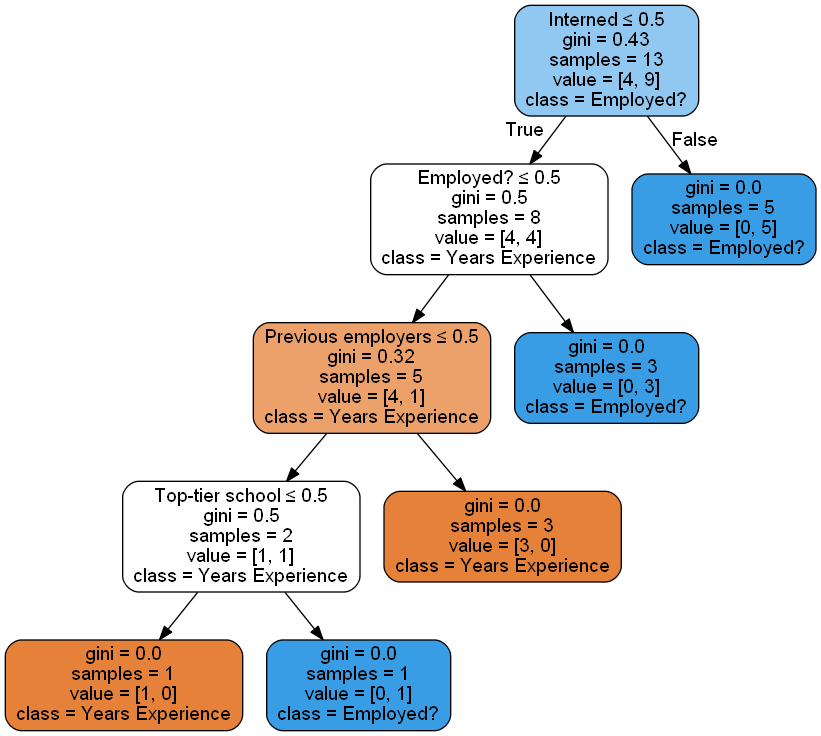

In [332]:
from IPython.display import Image
from sklearn.externals.six import StringIO
import pydot

dot_data = StringIO()
tree.export_graphviz(model, out_file=dot_data, 
                     feature_names=features,
                     class_names=features,  
                     rounded = True, proportion = False, 
                     precision = 2, filled = True,
                     special_characters=True) 
(graph, )  = pydot.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

Data mostly contains Yes/No, meaning 1/0. So, if the employment status is less then 0.5 then move left on diagram and if it is bigger then move right, and so on. 'gini' score is a measure of entropy.

### Ensemble learning by using RandomForestClassifier

Over fitting issue in the dataset is crucial, to overcome this a random forest classifier of multiple decision trees is applied as the model to predict target value

In [347]:
import numpy as np

from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

model = RandomForestClassifier(n_estimators=10)
model.fit(X, y)

print(dict(zip(X.columns,model.feature_importances_)))

# array.reshape(-1, 1) if your data has a single feature 
# array.reshape(1, -1) if it contains a single sample.
'''
 'Years Experience',
 'Employed?',
 'Previous employers',
 'Level of Education',
 'Top-tier school',
 'Interned'

'''
# predict employment of an employed 3-year experience with PhD
X_test = np.array([3, 1, 4, 2, 0, 0]).reshape(1,-1)
predictions = model.predict(X_test)
print('Model prediction\t:', predictions)

# predict employment of an unemployed 3-year experience with PhD
X_test = np.array([3, 0, 4, 2, 0, 0]).reshape(1,-1)
predictions = model.predict(X_test)
print('Model prediction\t:', predictions)

{'Years Experience': 0.1945833333333333, 'Employed?': 0.1909369488536155, 'Previous employers': 0.18551209372637945, 'Level of Education': 0.1245408163265306, 'Top-tier school': 0.05251157407407407, 'Interned': 0.25191523368606705}
Model prediction	: [1]
Model prediction	: [1]


In [ ]:
dot_data = StringIO()
tree.export_graphviz(model.estimators_[0], out_file=dot_data, 
                     feature_names=features,  
                     class_names=features,  
                     rounded = True, proportion = False, 
                     precision = 2, filled = True,
                     special_characters=True) 
(graph, )  = pydot.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

### 2. Decision whether giving a loan to a bank client

In [ ]:
# Load libraries
import pandas as pd
import numpy as np

# models
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier

# stats
from sklearn.metrics import accuracy_score, confusion_matrix

# encoders
from sklearn.preprocessing import LabelEncoder

# data splitting
from sklearn.model_selection import train_test_split

# plotting
from IPython.display import Image
from sklearn.externals.six import StringIO
import pydot

In [ ]:
from urllib.request import urlopen
# file link from UCI Machine repository, SMS Spam Collection Data Set 
urllink = 'https://archive.ics.uci.edu/ml/machine-learning-databases/00222/bank.zip'
zipName = 'bank.zip'
# open and save the zip file onto computer
url = urlopen(urllink)
output = open(zipName, 'wb')    # note the flag:  "wb"        
output.write(url.read())
output.close()

from zipfile import ZipFile
# read zipfile and extract, then close
zipfile = ZipFile(zipName,'r')
ziplist = zipfile.namelist()
print(ziplist)
zipfile.extractall()
zipfile.close()

### Encoding using LabelEncoder

In [377]:
# read data again, or copy(?)
df = pd.read_csv('bank.csv', header=0, sep=';')

# Select what features will be used in the model to predict
features = ['age','job','marital','education','balance','housing','loan','contact']

# Sklearn requires all inputs to be numeric,
# Then convert all our categorical variables into numeric by encoding the categories
le = LabelEncoder()
for i in features:
    df[i] = le.fit_transform(df[i])

# check data information 
#print(df.info())

# Define feature and target columns, output (target) variable is y
# y: has the client subscribed a term deposit? (binary: 'yes','no')
X = df[features]
y = df['y']

# Split data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# model, train, and prediction
model = DecisionTreeClassifier()
model.fit(X_train,y_train)
predictions = model.predict(X_test)

print('DecisionTreeClassifier\n')
print('Model prediction\t:', predictions,'\n')
print('Model accuracy \t:', accuracy_score(y_test, predictions),'\n')

# interpretation of the significance of the features (predictors) included
# based on the decision tree, it shows what variable plays the most important role
print('Model importances\n', dict(zip(X_train.columns,model.feature_importances_)),'\n')

print('Model confusion matrix\n', confusion_matrix(y_test, predictions),'\n')

DecisionTreeClassifier

Model prediction	: ['no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no'
 'no' 'yes' 'no' 'yes' 'no' 'yes' 'no' 'no' 'no' 'no' 'yes' 'no' 'no'
 'yes' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'yes' 'no' 'no'
 'no' 'no' 'no' 'no' 'no' 'no' 'yes' 'no' 'yes' 'no' 'no' 'no' 'no' 'no'
 'no' 'no' 'yes' 'no' 'no' 'yes' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no'
 'yes' 'yes' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no'
 'no' 'no' 'no' 'yes' 'no' 'yes' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no'
 'no' 'no' 'no' 'no' 'no' 'no' 'yes' 'no' 'no' 'no' 'yes' 'no' 'no' 'no'
 'no' 'no' 'no' 'no' 'no' 'yes' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no'
 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'yes' 'no'
 'no' 'no' 'yes' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no'
 'no' 'no' 'yes' 'no' 'no' 'no' 'no' 'no' 'yes' 'yes' 'no' 'no' 'no' 'no'
 'no' 'no' 'yes' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'yes'
 'no' 'no' 'no'

In [373]:
dot_data = StringIO()
tree.export_graphviz(model, out_file=dot_data, 
                     feature_names=features,  
                     class_names=features,  
                     rounded = True, proportion = False, 
                     precision = 2, filled = True,
                     special_characters=True) 
(graph, ) = pydot.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

In [380]:
model = RandomForestClassifier(n_estimators=10)
model.fit(X_train,y_train)
predictions = model.predict(X_test)

print('RandomForestClassifier\n')
print('Model prediction\t:', predictions,'\n')
print('Model accuracy \t:', accuracy_score(y_test, predictions),'\n')

# interpretation of the significance of the features (predictors) included
# based on the decision tree, it shows what variable plays the most important role
print('Model importances\n', dict(zip(X_train.columns,model.feature_importances_)),'\n')

print('Model confusion matrix\n', confusion_matrix(y_test, predictions),'\n')

RandomForestClassifier

Model prediction	: ['no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no'
 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no'
 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no'
 'no' 'no' 'no' 'no' 'no' 'yes' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no'
 'no' 'no' 'no' 'no' 'yes' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'yes'
 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no'
 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no'
 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no'
 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no'
 'no' 'yes' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'yes' 'no' 'no'
 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no'
 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no'
 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no' 'no'
 'no' 'no' 'no' 'no' 'no' 'no

In [381]:
dot_data = StringIO()
tree.export_graphviz(model.estimators_[0], out_file=dot_data, 
                     feature_names=features,  
                     class_names=features,  
                     rounded = True, proportion = False, 
                     precision = 2, filled = True,
                     special_characters=True) 
(graph, ) = pydot.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

### 3. Classification of Iris dataset

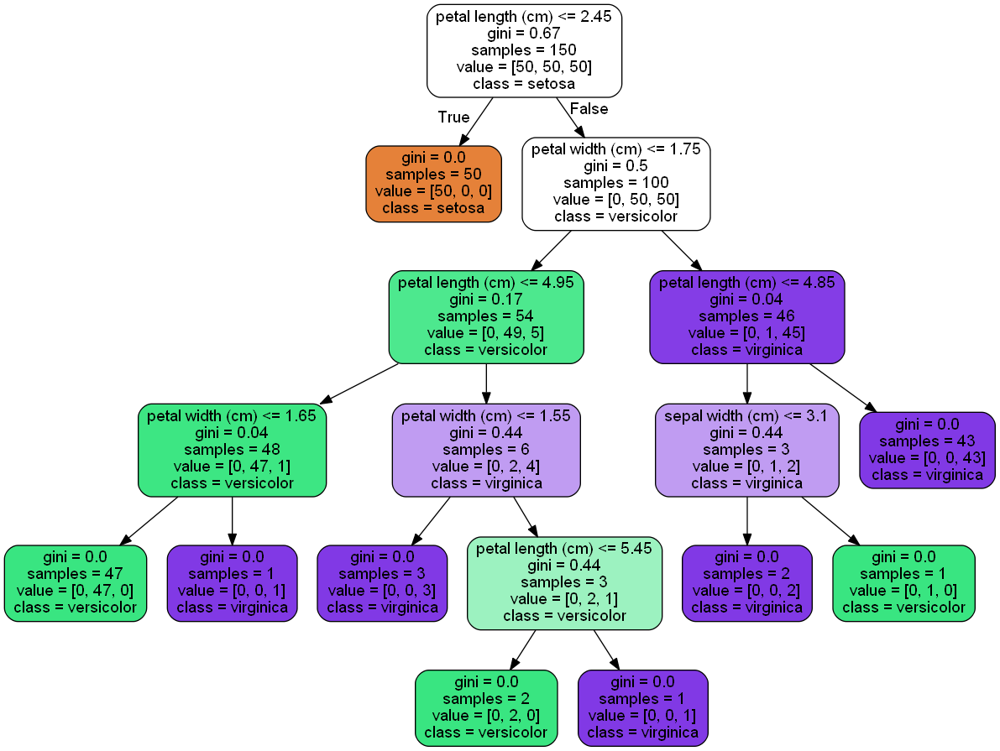

In [382]:
from sklearn.datasets import load_iris

from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier

from IPython.display import Image
from sklearn.externals.six import StringIO
import pydot

iris = load_iris()

model = DecisionTreeClassifier()
model.fit(iris.data, iris.target)

dot_data = StringIO()
tree.export_graphviz(model, out_file=dot_data, 
                    feature_names = iris.feature_names,
                    class_names = iris.target_names,
                    rounded = True, proportion = False, 
                    precision = 2, filled = True)
(graph, ) = pydot.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

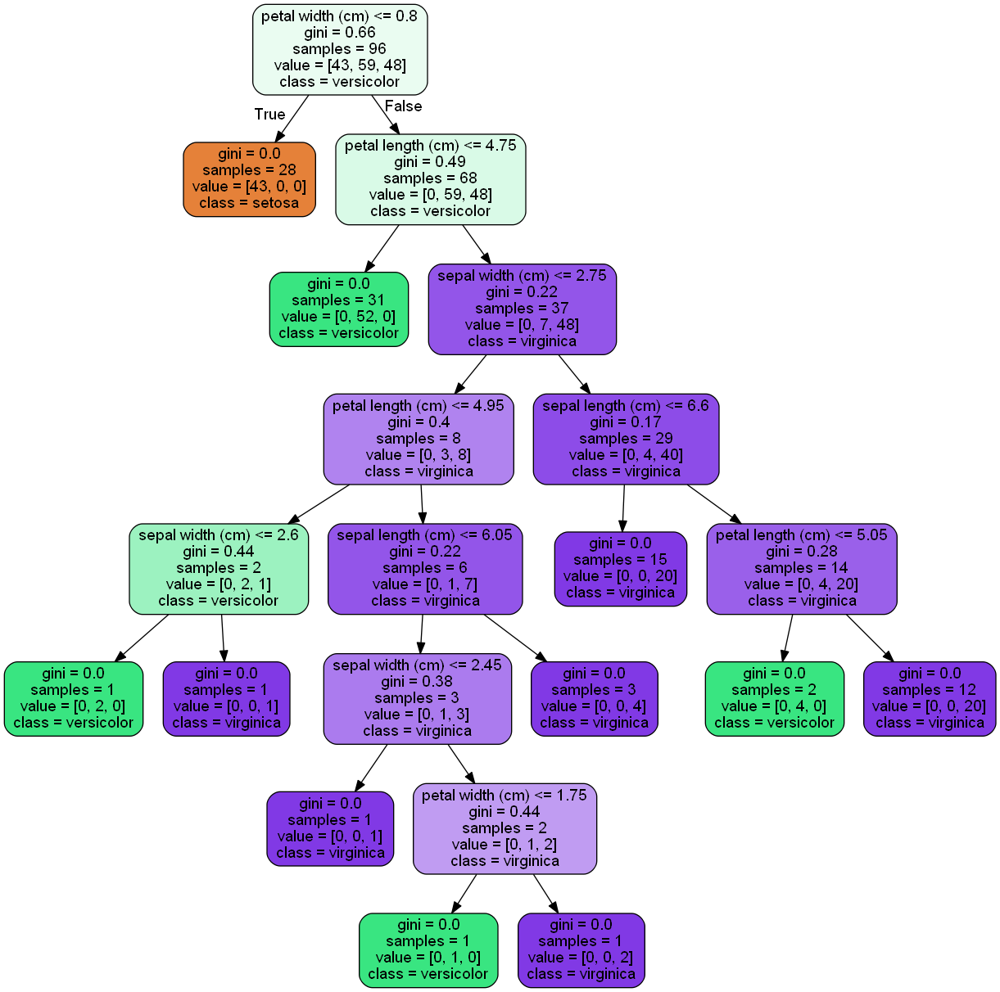

In [383]:
# Model (can also use single decision tree)
from sklearn.ensemble import RandomForestClassifier
model = RandomForestClassifier(n_estimators=10)
# Train
model.fit(iris.data, iris.target)
# Extract single tree
estimator = model.estimators_[5]

tree.export_graphviz(estimator, out_file='tree_from_forest.dot', 
                    feature_names = iris.feature_names,
                    class_names = iris.target_names,
                    rounded = True, proportion = False, 
                    precision = 2, filled = True)
(graph,) = pydot.graph_from_dot_file('tree_from_forest.dot')
Image(graph.create_png())